# Random Basis Functions
### Loss = Mean Squared Error
### No utilizzo di Libreria

In [1]:
import sys
sys.path.append('../../code')
import deepxde as dde
import matplotlib.pyplot as plt
import numpy as np
# Import tf if using backend tensorflow.compat.v1 or tensorflow
from deepxde.backend import tf
#import deepxde
from keras.models import Sequential
from keras.layers import Dense
import keras
from contextlib import redirect_stdout

Using backend: tensorflow
Other supported backends: tensorflow.compat.v1, pytorch, jax, paddle.
paddle supports more examples now and is recommended.


In [2]:
log_path = "text_file_name.txt"  # it will be created automatically

class print_training_on_text_every_10_epochs_Callback(keras.callbacks.Callback):
    def __init__(self, logpath):
        self.logpath = logpath

    def on_epoch_end(self, epoch, logs={}):
        with open(self.logpath, "a") as writefile:  # put log_path here
            with redirect_stdout(writefile):
                if (int(epoch) % 10) == 0:
                    print(
                        f"Epoch: {epoch:>3}"
                        + f" | Loss: {logs['loss']:.4e}"
                        + f" | Accuracy: {logs['accuracy']:.4e}"
                        + f" | Validation loss: {logs['val_loss']:.4e}"
                        + f" | Validation accuracy: {logs['val_accuracy']:.4e}"
                    )
                    writefile.write("\n")

my_callbacks = [
    print_training_on_text_every_10_epochs_Callback(logpath=log_path),
]

In [4]:
M = 400
Rm = 20
d=1
pi = np.pi

train = np.array([np.linspace(-2, 2, 40)])
test = np.array([np.linspace(-2, 2, 100)])

def func(x):
    #return np.sin(np.pi * x)
    return np.sin(3*pi*x + 3*pi/20)*np.cos(2*pi*x + pi/10) + 2
    
y_train = func(train).T

y_test = func(test).T

k_init = tf.keras.initializers.RandomUniform(minval=-Rm, maxval=Rm)
b_init = tf.keras.initializers.RandomUniform(minval=-Rm/10, maxval=Rm/10)
def custom_activation(x):
    return tf.sin(x)

model = Sequential()
#layer1 = Dense(M, activation=custom_activation)

model.add(Dense(M, activation=custom_activation, input_dim=d))#, kernel_initializer=k_init,bias_initializer=b_init, trainable=False))
model.add(Dense(1))
model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer='adam', 
                metrics=[tf.keras.losses.MeanAbsoluteError(reduction="auto", name="mean_absolute_error"),'accuracy'])

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=100)
history = model.fit(train.T, y_train, validation_data = (test.T,y_test), epochs=10, batch_size=64, callbacks=my_callbacks)

Epoch 1/10
1/1 [==============================] - 1s 575ms/step - loss: 4.3006 - mean_absolute_error: 2.0108 - accuracy: 0.0000e+00 - val_loss: 4.1591 - val_mean_absolute_error: 1.9463 - val_accuracy: 0.0000e+00
Epoch 2/10
1/1 [==============================] - 0s 39ms/step - loss: 4.1841 - mean_absolute_error: 1.9857 - accuracy: 0.0000e+00 - val_loss: 4.0498 - val_mean_absolute_error: 1.9344 - val_accuracy: 0.0000e+00
Epoch 3/10
1/1 [==============================] - 0s 35ms/step - loss: 4.0755 - mean_absolute_error: 1.9606 - accuracy: 0.0000e+00 - val_loss: 3.9470 - val_mean_absolute_error: 1.9210 - val_accuracy: 0.0000e+00
Epoch 4/10
1/1 [==============================] - 0s 46ms/step - loss: 3.9734 - mean_absolute_error: 1.9353 - accuracy: 0.0000e+00 - val_loss: 3.8484 - val_mean_absolute_error: 1.9051 - val_accuracy: 0.0000e+00
Epoch 5/10
1/1 [==============================] - 0s 47ms/step - loss: 3.8753 - mean_absolute_error: 1.9095 - accuracy: 0.0000e+00 - val_loss: 3.7509 - val

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 400)               800       
                                                                 
 dense_1 (Dense)             (None, 1)                 401       
                                                                 
Total params: 1,201
Trainable params: 1,201
Non-trainable params: 0
_________________________________________________________________
None


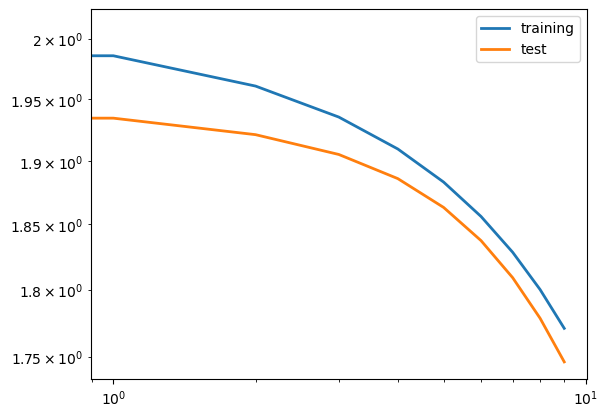

In [5]:
print(model.summary())
bc     = history.history['mean_absolute_error']
bc_val     = history.history['val_mean_absolute_error']

plt.loglog(range(np.shape(bc)[0]),bc, linewidth=2, label='training')
plt.loglog(range(np.shape(bc_val)[0]),bc_val, linewidth=2, label='test')
plt.legend()
plt.show()

32/32 [==============================] - 0s 764us/step


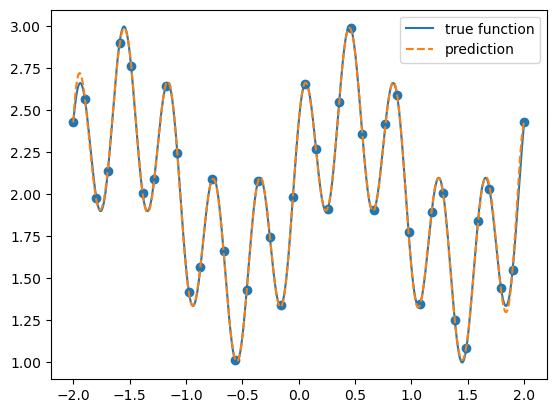

In [11]:
val = np.linspace(-2, 2, 1000)

y_pred = model.predict(val)
plt.plot(val, func(val), label='true function')
plt.plot(val, y_pred, label='prediction', ls='--')
plt.scatter(train, y_train)
plt.legend()

In [9]:
M = 200
Rm = 4
d=1
pi = np.pi

train = np.array([np.linspace(-3, 2, 40)])
test = np.array([np.linspace(-3, 2, 100)])

def func(x):
    #return np.sin(np.pi * x)
    return 0.5*x**5 + 1.3*x**4 - 2.7*x**3 - 5.5*x**2 + 2.7*x + 2.3
    
y_train = func(train).T

y_test = func(test).T

k_init = tf.keras.initializers.RandomUniform(minval=-Rm, maxval=Rm)
b_init = tf.keras.initializers.RandomUniform(minval=-Rm, maxval=Rm)
def custom_activation(x):
    return tf.sin(x)

model = Sequential()
#layer1 = Dense(M, activation=custom_activation)

model.add(Dense(M, activation=custom_activation, input_dim=d, kernel_initializer=k_init,bias_initializer=b_init, trainable=False))
model.add(Dense(1))
model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer='adam', 
                metrics=[tf.keras.losses.MeanAbsoluteError(reduction="auto", name="mean_absolute_error"),'accuracy'])

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=100)
history = model.fit(train.T, y_train, validation_data = (test.T,y_test), epochs=1000, batch_size=64, callbacks=[callback])

Epoch 1/1000
1/1 [==============================] - 0s 419ms/step - loss: 8.5131 - mean_absolute_error: 2.5976 - accuracy: 0.0000e+00 - val_loss: 8.3538 - val_mean_absolute_error: 2.5312 - val_accuracy: 0.0000e+00
Epoch 2/1000
1/1 [==============================] - 0s 24ms/step - loss: 8.2576 - mean_absolute_error: 2.5595 - accuracy: 0.0000e+00 - val_loss: 8.0980 - val_mean_absolute_error: 2.4932 - val_accuracy: 0.0000e+00
Epoch 3/1000
1/1 [==============================] - 0s 26ms/step - loss: 8.0069 - mean_absolute_error: 2.5214 - accuracy: 0.0000e+00 - val_loss: 7.8471 - val_mean_absolute_error: 2.4553 - val_accuracy: 0.0000e+00
Epoch 4/1000
1/1 [==============================] - 0s 28ms/step - loss: 7.7610 - mean_absolute_error: 2.4834 - accuracy: 0.0000e+00 - val_loss: 7.6013 - val_mean_absolute_error: 2.4174 - val_accuracy: 0.0000e+00
Epoch 5/1000
1/1 [==============================] - 0s 31ms/step - loss: 7.5201 - mean_absolute_error: 2.4454 - accuracy: 0.0000e+00 - val_loss: 7.

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 200)               400       
                                                                 
 dense_9 (Dense)             (None, 1)                 201       
                                                                 
Total params: 601
Trainable params: 201
Non-trainable params: 400
_________________________________________________________________
None
0.26329195499420166
0.26329195499420166


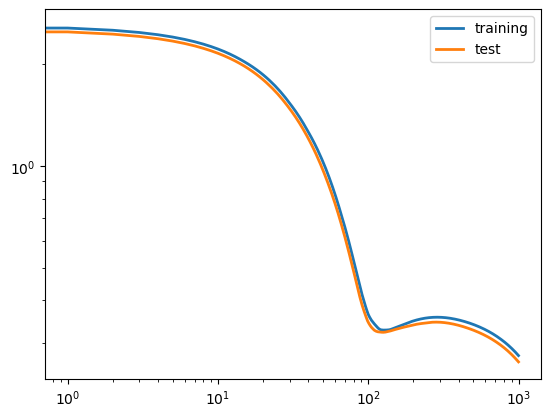

32/32 [==============================] - 0s 831us/step


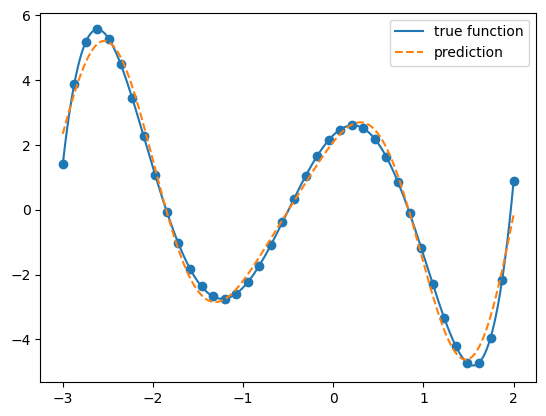

In [13]:
print(model.summary())
bc     = history.history['mean_absolute_error']
bc_val     = history.history['val_mean_absolute_error']

print(np.min(history.history['val_mean_absolute_error']))
print(bc_val[-1])
plt.loglog(range(np.shape(bc)[0]),bc, linewidth=2, label='training')
plt.loglog(range(np.shape(bc_val)[0]),bc_val, linewidth=2, label='test')
plt.legend()
plt.show()

val = np.linspace(-3, 2, 1000)

y_pred = model.predict(val)
plt.plot(val, func(val), label='true function')
plt.plot(val, y_pred, label='prediction', ls='--')
plt.scatter(train, y_train)
plt.legend()

#### Validation loss rispetto diversi valori di M

In [2]:
from keras.models import Sequential
from keras.layers import Dense

pi = np.pi
history = {}
mm = [100, 200, 400, 600]
rr = [0.5, 1, 2, 5 , 10]
for M in mm:
#M = 100
    Rm = 2
    d=1

    weight = np.zeros((M,d))
    biases = np.zeros((M,1))

    for i in range(M):
        for j in range(d):
            weight[i][j]= np.random.uniform(low=-Rm, high=Rm)
        biases[i] = np.random.uniform(low=-0.0005, high=0.0005)

    def phi(x):
        bias = np.repeat(biases, np.shape(x)[1], axis = -1)
        out = np.sin(weight@x + bias)
        return out

    train = np.array([np.linspace(-1, 1, 20)])
    test = np.array([np.linspace(-1, 1, 7)])

    def func(x):
        return np.sin(np.pi * x)
        #return np.sin(3*pi*x + 3*pi/20)*np.cos(2*pi*x + pi/10) + 2
        
    y_train = func(train).T

    y_test = func(test).T

    k_init = tf.keras.initializers.RandomUniform(minval=-Rm, maxval=Rm)
    b_init = tf.keras.initializers.RandomUniform(minval=-0.0005, maxval=0.0005)
    def custom_activation(x):
        return tf.sin(x)

    model = Sequential()
    #layer1 = Dense(M, activation=custom_activation)

    model.add(Dense(M, activation=custom_activation, input_dim=d, kernel_initializer=k_init,bias_initializer=b_init, trainable=False))
    model.add(Dense(1))
    model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer='adam', 
                    metrics=[tf.keras.losses.MeanAbsoluteError(reduction="auto", name="mean_absolute_error"),'accuracy'])

    callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=100)
    history[M] = model.fit(train.T, y_train, validation_data = (test.T,y_test), epochs=5000, batch_size=64, callbacks=[callback])

Epoch 1/5000
1/1 [==============================] - 1s 500ms/step - loss: 0.1624 - mean_absolute_error: 0.3570 - accuracy: 0.0000e+00 - val_loss: 0.2267 - val_mean_absolute_error: 0.4061 - val_accuracy: 0.1429
Epoch 2/5000
1/1 [==============================] - 0s 28ms/step - loss: 0.1605 - mean_absolute_error: 0.3546 - accuracy: 0.0000e+00 - val_loss: 0.2236 - val_mean_absolute_error: 0.4034 - val_accuracy: 0.1429
Epoch 3/5000
1/1 [==============================] - 0s 29ms/step - loss: 0.1586 - mean_absolute_error: 0.3526 - accuracy: 0.0000e+00 - val_loss: 0.2200 - val_mean_absolute_error: 0.4011 - val_accuracy: 0.1429
Epoch 4/5000
1/1 [==============================] - 0s 28ms/step - loss: 0.1567 - mean_absolute_error: 0.3506 - accuracy: 0.0000e+00 - val_loss: 0.2166 - val_mean_absolute_error: 0.3987 - val_accuracy: 0.1429
Epoch 5/5000
1/1 [==============================] - 0s 29ms/step - loss: 0.1548 - mean_absolute_error: 0.3487 - accuracy: 0.0000e+00 - val_loss: 0.2136 - val_mean_

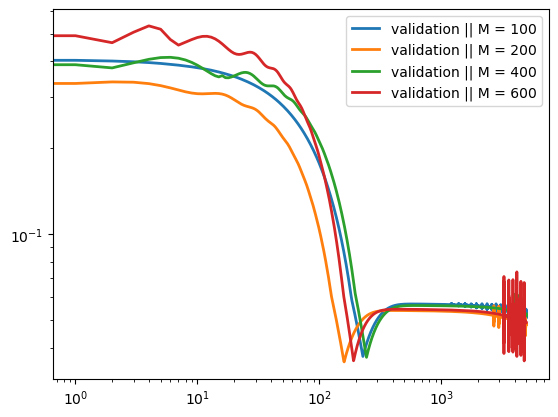

In [3]:
for M in mm:
    bc     = history[M].history['mean_absolute_error']
    bc_val     = history[M].history['val_mean_absolute_error']

    #plt.loglog(range(np.shape(bc)[0]),bc, linewidth=2, label='training || M = ' + str(M))
    plt.loglog(range(np.shape(bc_val)[0]),bc_val, linewidth=2, label='validation || M = ' + str(M))
plt.legend()
plt.show()

#### Validation loss rispetto diversi valori di Rm

In [4]:
from keras.models import Sequential
from keras.layers import Dense

pi = np.pi
history = {}
mm = [100, 200, 400, 600]
rr = [0.5, 1, 2, 5 , 10]
for Rm in rr:
    M = 200
    #Rm = 2
    d=1

    weight = np.zeros((M,d))
    biases = np.zeros((M,1))

    for i in range(M):
        for j in range(d):
            weight[i][j]= np.random.uniform(low=-Rm, high=Rm)
        biases[i] = np.random.uniform(low=-0.0005, high=0.0005)

    def phi(x):
        bias = np.repeat(biases, np.shape(x)[1], axis = -1)
        out = np.sin(weight@x + bias)
        return out

    train = np.array([np.linspace(-1, 1, 20)])
    test = np.array([np.linspace(-1, 1, 7)])

    def func(x):
        return np.sin(np.pi * x)
        #return np.sin(3*pi*x + 3*pi/20)*np.cos(2*pi*x + pi/10) + 2
        
    y_train = func(train).T

    y_test = func(test).T

    k_init = tf.keras.initializers.RandomUniform(minval=-Rm, maxval=Rm)
    b_init = tf.keras.initializers.RandomUniform(minval=-0.0005, maxval=0.0005)
    def custom_activation(x):
        return tf.sin(x)

    model = Sequential()
    #layer1 = Dense(M, activation=custom_activation)

    model.add(Dense(M, activation=custom_activation, input_dim=d, kernel_initializer=k_init,bias_initializer=b_init, trainable=False))
    model.add(Dense(1))
    model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer='adam', 
                    metrics=[tf.keras.losses.MeanAbsoluteError(reduction="auto", name="mean_absolute_error"),'accuracy'])

    callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=100)
    history[Rm] = model.fit(train.T, y_train, validation_data = (test.T,y_test), epochs=3000, batch_size=64, callbacks=[callback])

Epoch 1/3000
1/1 [==============================] - 1s 511ms/step - loss: 0.4451 - mean_absolute_error: 0.5866 - accuracy: 0.0000e+00 - val_loss: 0.3828 - val_mean_absolute_error: 0.4949 - val_accuracy: 0.1429
Epoch 2/3000
1/1 [==============================] - 0s 26ms/step - loss: 0.4179 - mean_absolute_error: 0.5702 - accuracy: 0.0000e+00 - val_loss: 0.3636 - val_mean_absolute_error: 0.4946 - val_accuracy: 0.1429
Epoch 3/3000
1/1 [==============================] - 0s 28ms/step - loss: 0.3925 - mean_absolute_error: 0.5539 - accuracy: 0.0000e+00 - val_loss: 0.3467 - val_mean_absolute_error: 0.4944 - val_accuracy: 0.1429
Epoch 4/3000
1/1 [==============================] - 0s 26ms/step - loss: 0.3691 - mean_absolute_error: 0.5376 - accuracy: 0.0000e+00 - val_loss: 0.3320 - val_mean_absolute_error: 0.4943 - val_accuracy: 0.1429
Epoch 5/3000
1/1 [==============================] - 0s 26ms/step - loss: 0.3477 - mean_absolute_error: 0.5214 - accuracy: 0.0000e+00 - val_loss: 0.3195 - val_mean_

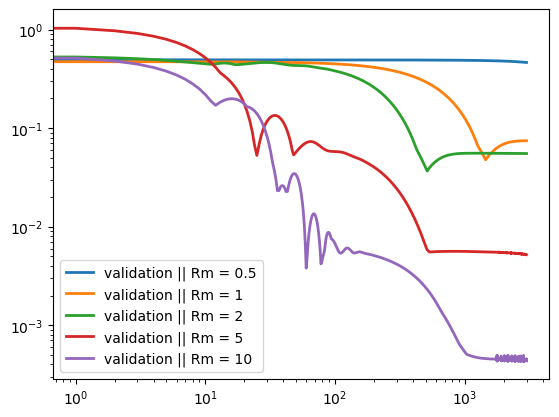

In [5]:
for Rm in rr:
    bc     = history[Rm].history['mean_absolute_error']
    bc_val     = history[Rm].history['val_mean_absolute_error']

    #plt.loglog(range(np.shape(bc)[0]),bc, linewidth=2, label='training || Rm = ' + str(Rm))
    plt.loglog(range(np.shape(bc_val)[0]),bc_val, linewidth=2, label='validation || Rm = ' + str(Rm))
plt.legend()
plt.show()

# Deepxde
### Poisson 1D: soluzione = $sin(\pi\,x)$

In [1]:
import sys
sys.path.append('../../code')
import deepxde as dde
import matplotlib.pyplot as plt
import numpy as np
# Import tf if using backend tensorflow.compat.v1 or tensorflow
from deepxde.backend import tf
from numba import njit, prange

Using backend: tensorflow
Other supported backends: tensorflow.compat.v1, pytorch, jax, paddle.
paddle supports more examples now and is recommended.


In [2]:
def pde(x, y):
    dy_xx = dde.grad.hessian(y, x)
    # Use tf.sin for backend tensorflow.compat.v1 or tensorflow
    return -dy_xx - np.pi ** 2 * tf.sin(np.pi * x)
    #return -dy_xx - 13*pi**2*tf.sin(3*pi*x + 3*pi/20)*tf.cos(2*pi*x + pi/10) - 12*pi**2*tf.cos(3*pi*x + 3*pi/20)*tf.sin(2*pi*x + pi/10)

def boundary(x, on_boundary):
    return on_boundary

def func(x):
    return np.sin(np.pi * x)
    #return np.sin(3*pi*x + 3*pi/20)*np.cos(2*pi*x + pi/10) + 2

geom = dde.geometry.Interval(-1, 1)
bc = dde.icbc.DirichletBC(geom, func, boundary)
data = dde.data.PDE(geom, pde, bc, 16, 2, solution=func, num_test=100)

In [7]:
def pou(N, dim, x, solution, boundary, pde, num_train=10, num_boundary=2, num_validation=100, M=50, Rm=10, iter=20000):

    geom, bc, data = np.empty(N, dtype=object), np.empty(N, dtype=object), np.empty(N, dtype=object)
    
    layer_size = [1] + [M]  +  [1]
    activation = ["sin", 'linear']
    initializer = "Glorot uniform"

    model, net = np.empty(N, dtype=object), np.empty(N, dtype=object)
    losshistory, train_state = np.empty(N, dtype=object), np.empty(N, dtype=object)

    if dim == 1:
        xx = np.linspace(x[0], x[1], N+1)
        for i in prange(N):
            
            geom[i] = dde.geometry.Interval(xx[i], xx[i+1])
            bc[i] = dde.icbc.DirichletBC(geom[i], solution, boundary)
            data[i] = dde.data.PDE(geom[i], pde, bc[i], num_train, num_boundary, solution=solution, num_test=num_validation)

            net[i] = dde.nn.random_FNN(layer_size, activation, initializer, Rm=Rm)

            model[i] = dde.Model(data[i], net[i])

            model[i].compile("adam", lr=0.001, metrics=["l2 relative error"])

            losshistory[i], train_state[i] = model[i].train(iterations=iter)

    return model, losshistory, train_state, geom


def pou_visualization(losses, train_state):
    N = np.shape(train_state)[0]
    xtest, ytest, ypred = np.empty(N, dtype=object), np.empty(N, dtype=object), np.empty(N, dtype=object)
    for i in range(N):
        xtest[i], ytest[i], ypred[i] = train_state[i].X_test, train_state[i].y_test, train_state[i].y_pred_test

        u = xtest[i][1]
        xtest[i] = np.delete(xtest[i], 1)
        xtest[i] = np.append(xtest[i], u)

        uu = ytest[i][1]
        ytest[i] = np.delete(ytest[i], 1)
        ytest[i] = np.append(ytest[i], uu)

        uuu = ypred[i][1]
        ypred[i] = np.delete(ypred[i], 1)
        ypred[i] = np.append(ypred[i], uuu)

        plt.scatter(xtest[i], ytest[i], c='black')
        plt.plot(xtest[i], ytest[i], c='black')
        plt.plot(xtest[i], ypred[i], c='red', ls = '--')
    
    plt.show()

    steps = losses[0].steps
    time = np.shape(steps)[0]
    max_train, max_test = np.zeros(time), np.zeros(time)

    for j in range(time):
        for i in range(N):
            train, test = losses[i].loss_test, losses[i].loss_train

            if train[j][0] > max_train[j]:
                max_train[j] = train[j][0]

            if test[j][0] > max_test[j]:
                max_test[j] = test[j][0]
    
    plt.plot(steps, max_train, c='orange', label='training loss')
    plt.plot(steps, max_test, c='green', label='validation loss')
    plt.yscale('log')
    plt.legend()
    plt.show()


In [8]:
model, loss, train, geom = pou(4, 1, [-1, 1], func, boundary, pde)

Compiling model...
'compile' took 0.000620 s

Training model...

Step      Train loss              Test loss               Test metric   
0         [2.87e+03, 2.53e+00]    [2.77e+03, 2.53e+00]    [1.60e+00]    
1000      [4.55e-01, 9.77e-02]    [3.57e-01, 9.77e-02]    [2.92e-01]    
2000      [2.17e-01, 1.34e-02]    [1.85e-01, 1.34e-02]    [9.54e-02]    
3000      [1.77e-01, 4.54e-03]    [1.51e-01, 4.54e-03]    [5.58e-02]    
4000      [1.25e-01, 1.09e-03]    [1.07e-01, 1.09e-03]    [2.83e-02]    
5000      [7.18e-02, 4.72e-05]    [6.13e-02, 4.72e-05]    [1.08e-02]    
6000      [2.97e-02, 4.54e-04]    [2.53e-02, 4.54e-04]    [1.96e-02]    
7000      [7.37e-03, 4.05e-04]    [6.28e-03, 4.05e-04]    [1.75e-02]    
8000      [8.26e-04, 7.61e-05]    [7.15e-04, 7.61e-05]    [7.51e-03]    
9000      [5.75e-05, 2.54e-06]    [5.02e-05, 2.54e-06]    [1.37e-03]    
10000     [3.61e-05, 2.21e-08]    [2.88e-05, 2.21e-08]    [1.32e-04]    
11000     [3.47e-05, 5.15e-09]    [2.73e-05, 5.15e-09]    [

c:\Users\Marco\anaconda3\lib\site-packages\keras\initializers\initializers_v2.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


Step      Train loss              Test loss               Test metric   
0         [2.03e+02, 7.66e-01]    [2.04e+02, 7.66e-01]    [1.43e+00]    
1000      [1.06e-02, 1.66e-02]    [1.14e-02, 1.66e-02]    [1.08e-01]    
2000      [9.06e-03, 5.96e-04]    [8.82e-03, 5.96e-04]    [2.07e-02]    
3000      [8.29e-03, 4.43e-06]    [7.82e-03, 4.43e-06]    [1.77e-03]    
4000      [7.44e-03, 1.29e-05]    [6.99e-03, 1.29e-05]    [2.90e-03]    
5000      [6.22e-03, 1.09e-05]    [5.83e-03, 1.09e-05]    [2.67e-03]    
6000      [5.58e-03, 9.63e-06]    [5.48e-03, 9.63e-06]    [2.65e-03]    
7000      [3.09e-03, 3.86e-06]    [2.86e-03, 3.86e-06]    [1.58e-03]    
8000      [1.92e-03, 1.61e-06]    [1.77e-03, 1.61e-06]    [1.03e-03]    
9000      [1.12e-03, 6.18e-07]    [1.02e-03, 6.18e-07]    [6.33e-04]    
10000     [6.28e-04, 2.45e-07]    [5.59e-04, 2.45e-07]    [4.01e-04]    
11000     [3.49e-04, 8.71e-08]    [3.00e-04, 8.71e-08]    [2.40e-04]    
12000     [1.98e-04, 3.63e-08]    [1.63e-04, 3.63e-

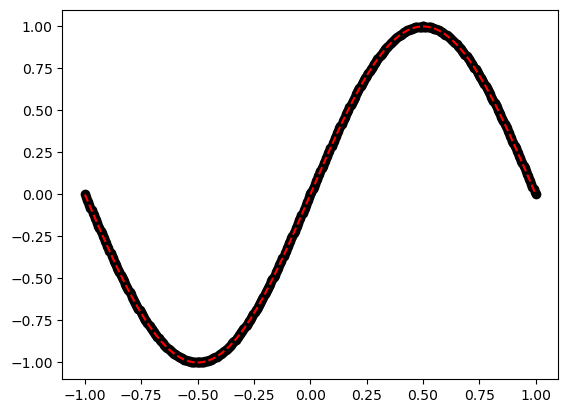

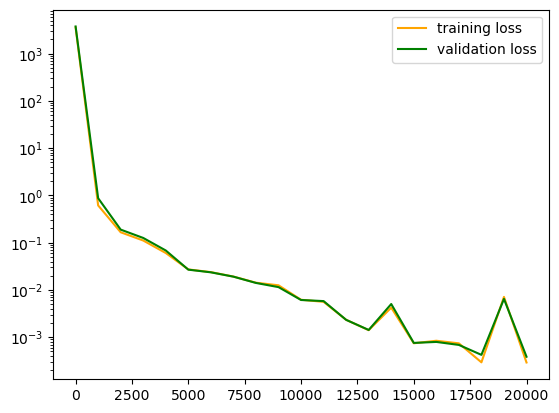

In [42]:
pou_visualization(loss, train)

##### Utilizzo del solo layer delle random feature

Compiling model...
'compile' took 0.001452 s

Training model...

Step      Train loss              Test loss               Test metric   


c:\Users\Marco\anaconda3\lib\site-packages\keras\initializers\initializers_v2.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


0         [5.56e+02, 8.56e-01]    [3.57e+02, 8.56e-01]    [6.46e-01]    
1000      [1.09e+00, 5.03e-02]    [8.49e-01, 5.03e-02]    [1.80e-01]    
2000      [7.44e-01, 6.02e-05]    [5.63e-01, 6.02e-05]    [7.84e-03]    
3000      [4.13e-01, 7.00e-03]    [3.09e-01, 7.00e-03]    [6.94e-02]    
4000      [1.63e-01, 4.85e-03]    [1.22e-01, 4.85e-03]    [5.75e-02]    
5000      [3.56e-02, 1.12e-03]    [2.72e-02, 1.12e-03]    [2.77e-02]    
6000      [2.92e-03, 8.95e-05]    [2.44e-03, 8.95e-05]    [7.85e-03]    
7000      [1.36e-04, 1.21e-06]    [1.62e-04, 1.21e-06]    [1.13e-03]    
8000      [9.38e-05, 2.12e-09]    [1.00e-04, 2.12e-09]    [6.67e-04]    
9000      [9.28e-05, 3.49e-09]    [9.83e-05, 3.49e-09]    [6.22e-04]    
10000     [9.12e-05, 3.46e-09]    [9.67e-05, 3.46e-09]    [6.13e-04]    
11000     [8.90e-05, 3.72e-09]    [9.49e-05, 3.72e-09]    [6.21e-04]    
12000     [8.55e-05, 2.36e-09]    [9.08e-05, 2.36e-09]    [6.21e-04]    
13000     [8.40e-05, 3.94e-09]    [9.08e-05, 3.94e-

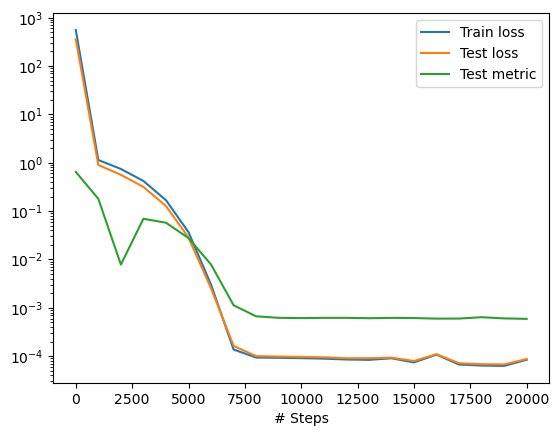

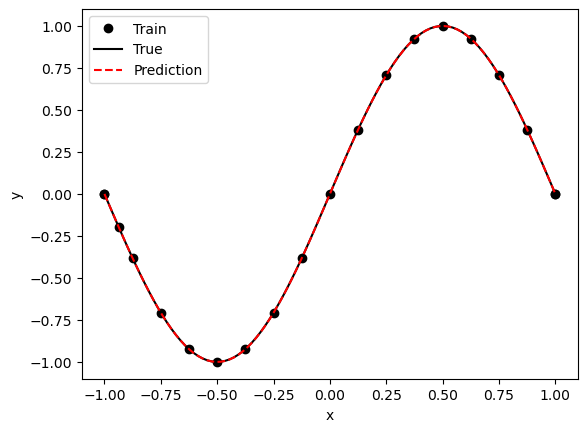

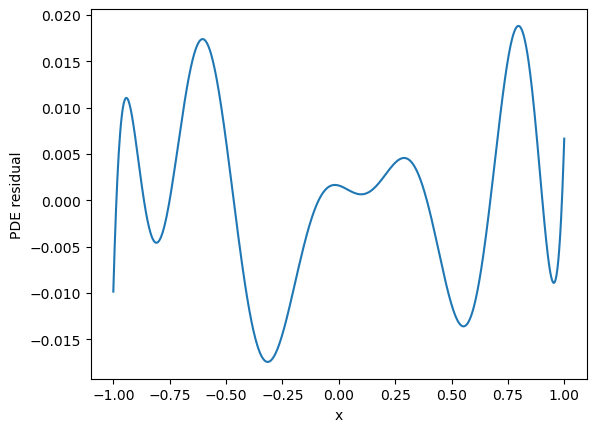

In [4]:
M =10
layer_size = [1] + [M]  +  [1]

activation = ["sin", 'linear']

initializer = "Glorot uniform"

net = dde.nn.random_FNN(layer_size, activation, initializer, Rm=10)

model = dde.Model(data, net)
#wei = np.ones(2)
#wei[0] = 0
#wei = tf.convert_to_tensor(wei, dtype=tf.float32)

model.compile("adam", lr=0.001, metrics=["l2 relative error"])#, loss_weights=wei)

losshistory, train_state = model.train(iterations=20000)

dde.saveplot(losshistory, train_state, issave=True, isplot=True)

x = geom.uniform_points(1000, True)
y = model.predict(x, operator=pde)
plt.figure()
plt.plot(x, y)
plt.xlabel("x")
plt.ylabel("PDE residual")
plt.show()

Compiling model...
'compile' took 0.000533 s

Training model...

Step      Train loss              Test loss               Test metric   
0         [3.84e+01, 3.25e+00]    [4.34e+01, 3.25e+00]    [9.84e-01]    
1000      [8.19e-01, 2.83e-01]    [7.46e-01, 2.83e-01]    [3.83e-01]    
2000      [2.65e-02, 5.13e-04]    [1.30e-02, 5.13e-04]    [2.02e-02]    
3000      [1.24e-02, 1.03e-04]    [6.54e-03, 1.03e-04]    [9.06e-03]    
4000      [6.18e-03, 2.29e-05]    [3.50e-03, 2.29e-05]    [4.39e-03]    
5000      [3.83e-03, 6.01e-06]    [2.46e-03, 6.01e-06]    [2.33e-03]    
6000      [1.89e-03, 1.86e-06]    [1.39e-03, 1.86e-06]    [1.28e-03]    
7000      [1.31e-03, 7.86e-07]    [1.12e-03, 7.86e-07]    [8.06e-04]    
8000      [9.30e-04, 4.82e-07]    [8.56e-04, 4.82e-07]    [6.18e-04]    
9000      [6.09e-04, 2.76e-07]    [6.07e-04, 2.76e-07]    [4.58e-04]    
10000     [4.04e-04, 1.21e-07]    [4.55e-04, 1.21e-07]    [3.21e-04]    
11000     [3.03e-04, 5.25e-08]    [3.71e-04, 5.25e-08]    [

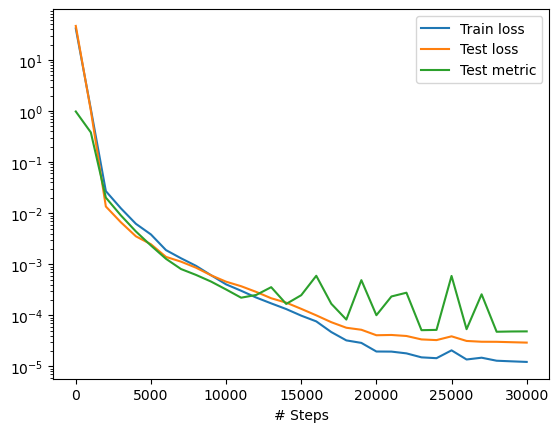

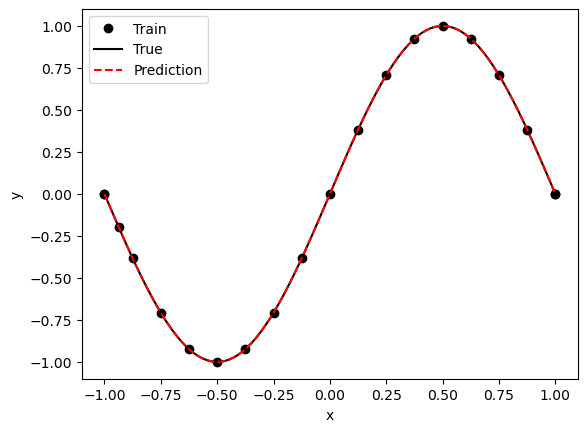

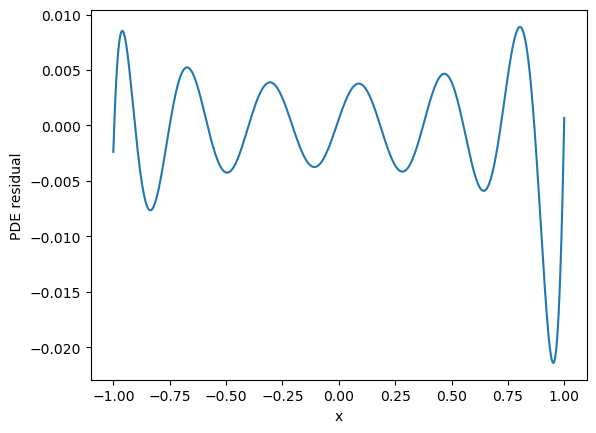

In [24]:
activation = ["tanh", 'tanh']

net = dde.nn.FNN(layer_size, activation, initializer)

model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])

losshistory, train_state = model.train(iterations=30000)

dde.saveplot(losshistory, train_state, issave=True, isplot=True)

x = geom.uniform_points(1000, True)
y = model.predict(x, operator=pde)
plt.figure()
plt.plot(x, y)
plt.xlabel("x")
plt.ylabel("PDE residual")
plt.show()

#### Confronto validation loss diversi valori di Rm

In [43]:
pi = np.pi
history = {}
rr = [0.5, 1, 2, 5, 10]

M = 200
layer_size = [1] + [M]  + [1]
activation = ["sin", 'linear']
initializer = "Glorot uniform"
loss = {}
epochs = {}
metric = {}
for i in rr:
    print(i)
    ll = []

    net = dde.nn.random_FNN(layer_size, activation, initializer, Rm=i)

    model = dde.Model(data, net)
    model.compile("adam", lr=0.001, metrics=["l2 relative error"])

    losshistory, train_state = model.train(iterations=50000)
    
    loss_test = losshistory.loss_test
    epochs[i] = losshistory.steps
    metric[i] = losshistory.metrics_test
    for j in range(np.shape(loss_test)[0]):
        ll.append(loss_test[j][0])
    loss[i] = ll

0.5
Compiling model...
'compile' took 0.000730 s

Training model...

Step      Train loss              Test loss               Test metric   


c:\Users\Marco\anaconda3\lib\site-packages\keras\initializers\initializers_v2.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


0         [4.35e+01, 1.95e-01]    [4.92e+01, 1.95e-01]    [1.09e+00]    
1000      [3.17e+01, 6.24e-03]    [3.53e+01, 6.24e-03]    [8.23e-01]    
2000      [2.52e+01, 1.68e-03]    [2.62e+01, 1.68e-03]    [6.85e-01]    
3000      [2.31e+01, 2.29e-04]    [2.19e+01, 2.29e-04]    [5.91e-01]    
4000      [2.27e+01, 7.22e-06]    [2.04e+01, 7.22e-06]    [5.46e-01]    
5000      [2.27e+01, 1.51e-07]    [2.01e+01, 1.51e-07]    [5.35e-01]    
6000      [2.27e+01, 2.93e-05]    [2.00e+01, 2.93e-05]    [5.33e-01]    
7000      [2.27e+01, 4.62e-07]    [2.00e+01, 4.62e-07]    [5.34e-01]    
8000      [2.27e+01, 2.37e-07]    [2.00e+01, 2.37e-07]    [5.34e-01]    
9000      [2.27e+01, 1.83e-04]    [2.00e+01, 1.83e-04]    [5.36e-01]    
10000     [2.27e+01, 3.83e-07]    [2.00e+01, 3.83e-07]    [5.34e-01]    
11000     [2.27e+01, 8.67e-07]    [2.00e+01, 8.67e-07]    [5.34e-01]    
12000     [2.27e+01, 1.84e-06]    [2.00e+01, 1.84e-06]    [5.34e-01]    
13000     [2.27e+01, 1.91e-08]    [2.00e+01, 1.91e-

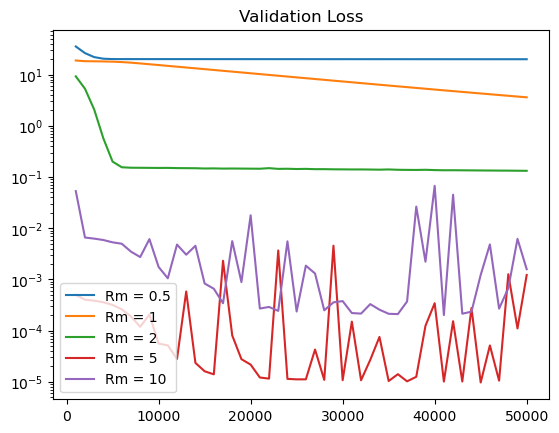

In [44]:
for i in loss:
    plt.plot(epochs[i][1:], loss[i][1:], label = 'Rm = ' + str(i))
plt.yscale('log')
plt.title('Validation Loss')
plt.legend()
plt.show()

### Confronto Validation loss per diversi valori di M

In [38]:
pi = np.pi
history = {}

Rm = 5
mm = [100, 200, 400, 600, 800]

activation = ["sin", 'linear']
initializer = "Glorot uniform"
loss = {}
epochs = {}
metric = {}

for M in mm:
    layer_size = [1] + [M]  + [1]
    ll = []

    net = dde.nn.random_FNN(layer_size, activation, initializer, Rm=Rm)

    model = dde.Model(data, net)
    model.compile("adam", lr=0.001, metrics=["l2 relative error"])

    losshistory, train_state = model.train(iterations=10000)
    
    loss_test = losshistory.loss_test
    epochs[M] = losshistory.steps
    metric[M] = losshistory.metrics_test
    for j in range(np.shape(loss_test)[0]):
        ll.append(loss_test[j][0])
    loss[M] = ll

Compiling model...
'compile' took 0.001030 s

Training model...

Step      Train loss              Test loss               Test metric   
0         [1.13e+02, 1.91e+00]    [1.18e+02, 1.91e+00]    [1.06e+00]    
1000      [7.47e-03, 2.65e-05]    [6.79e-03, 2.65e-05]    [3.43e-03]    
2000      [6.01e-04, 3.97e-09]    [4.93e-04, 3.97e-09]    [6.48e-04]    
3000      [5.85e-04, 4.31e-09]    [4.76e-04, 4.31e-09]    [6.59e-04]    
4000      [5.59e-04, 4.12e-09]    [4.55e-04, 4.12e-09]    [6.49e-04]    
5000      [5.19e-04, 3.72e-09]    [4.22e-04, 3.72e-09]    [6.38e-04]    
6000      [4.59e-04, 3.34e-09]    [3.72e-04, 3.34e-09]    [6.24e-04]    
7000      [3.74e-04, 2.34e-07]    [3.01e-04, 2.34e-07]    [6.35e-04]    
8000      [2.77e-04, 2.77e-09]    [2.22e-04, 2.77e-09]    [5.79e-04]    
9000      [1.83e-04, 4.90e-09]    [1.46e-04, 4.90e-09]    [5.82e-04]    
10000     [1.47e-04, 2.29e-07]    [1.36e-04, 2.29e-07]    [1.08e-03]    

Best model at step 10000:
  train loss: 1.47e-04
  test lo

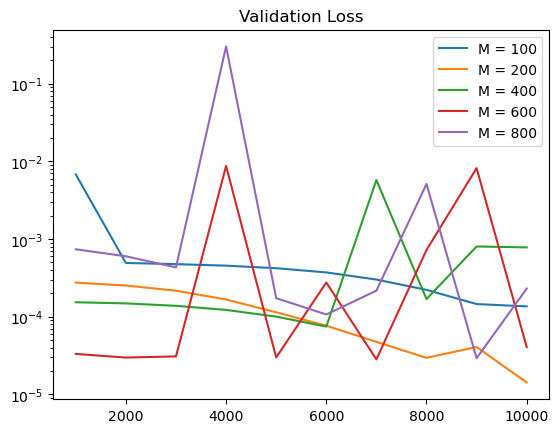

In [42]:
for i in loss:
    plt.plot(epochs[i][1:], loss[i][1:], label = 'M = ' + str(i))
plt.yscale('log')
plt.title('Validation Loss')
plt.legend()
plt.show()

## Poisson 1D: soluzione = $sin(3\pi\,x + \frac{3\pi}{20}) * cos(2\pi\,x + \frac{\pi}{10}) + 2$
#### dominio ristretto [-0.8, 0]

In [6]:
pi = np.pi
def pde(x, y):
    dy_xx = dde.grad.hessian(y, x)
    # Use tf.sin for backend tensorflow.compat.v1 or tensorflow
    #return -dy_xx - np.pi ** 2 * tf.sin(np.pi * x)
    return -dy_xx - 13*pi**2*tf.sin(3*pi*x + 3*pi/20)*tf.cos(2*pi*x + pi/10) - 12*pi**2*tf.cos(3*pi*x + 3*pi/20)*tf.sin(2*pi*x + pi/10)
    #return 0*x

def boundary(x, on_boundary):
    return on_boundary

def func(x):
    #return np.sin(np.pi * x)
    return np.sin(3*pi*x + 3*pi/20)*np.cos(2*pi*x + pi/10) + 2
    #return 0*x

geom = dde.geometry.Interval(-0.8, 0)
bc = dde.icbc.DirichletBC(geom, func, boundary)
num_points = 28
val_points = 100
data = dde.data.PDE(geom, pde, bc, num_points, 2, solution=func, num_test=val_points)

Compiling model...
'compile' took 0.000599 s

Training model...



c:\Users\Marco\anaconda3\lib\site-packages\keras\initializers\initializers_v2.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


Step      Train loss              Test loss               Test metric   
0         [1.06e+04, 3.79e+00]    [9.73e+03, 3.79e+00]    [1.63e+00]    
1000      [4.51e+03, 2.74e+01]    [3.94e+03, 2.74e+01]    [1.05e+01]    
2000      [4.28e+03, 8.09e+00]    [3.64e+03, 8.09e+00]    [8.05e+00]    
3000      [4.03e+03, 8.79e+00]    [3.44e+03, 8.79e+00]    [8.16e+00]    
4000      [3.67e+03, 8.96e+00]    [3.16e+03, 8.96e+00]    [7.20e+00]    
5000      [3.23e+03, 9.78e+00]    [2.80e+03, 9.78e+00]    [6.52e+00]    
6000      [2.74e+03, 1.03e+01]    [2.41e+03, 1.03e+01]    [5.60e+00]    
7000      [2.25e+03, 1.01e+01]    [2.01e+03, 1.01e+01]    [4.53e+00]    
8000      [1.80e+03, 9.46e+00]    [1.65e+03, 9.46e+00]    [3.60e+00]    
9000      [1.45e+03, 8.19e+00]    [1.37e+03, 8.19e+00]    [2.88e+00]    
10000     [1.20e+03, 6.28e+00]    [1.16e+03, 6.28e+00]    [2.22e+00]    
11000     [1.03e+03, 3.86e+00]    [1.02e+03, 3.86e+00]    [1.39e+00]    
12000     [9.21e+02, 1.89e+00]    [9.23e+02, 1.89e+

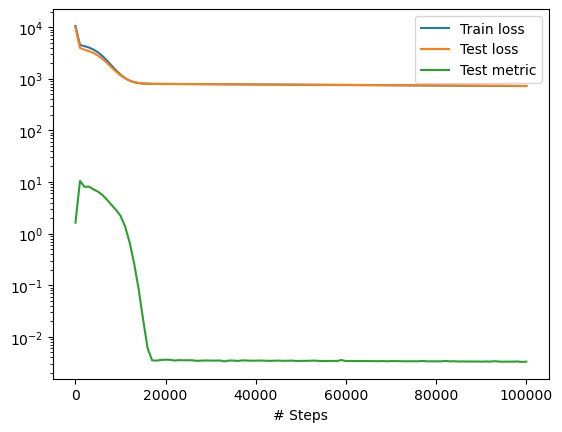

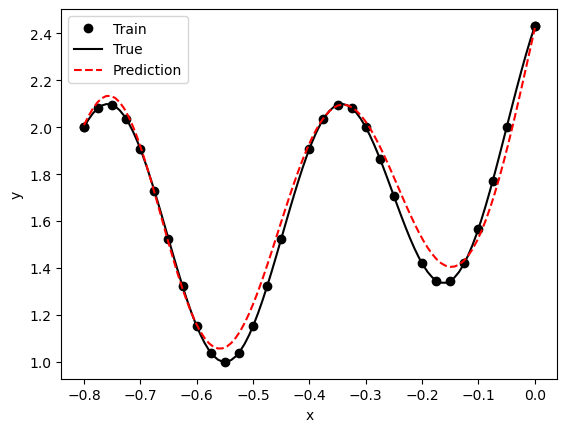

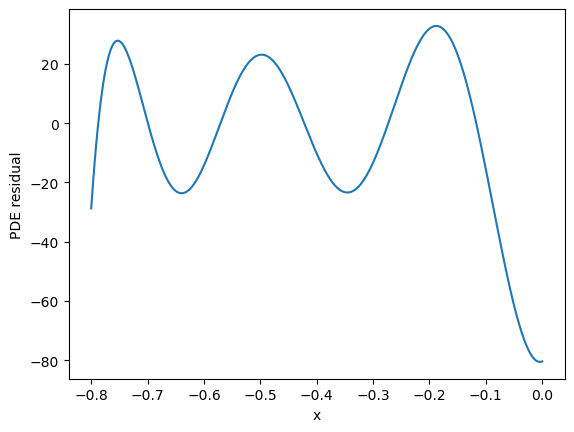

In [11]:
M =200
layer_size = [1] + [M]  + [1]

activation = ["sin", 'linear']

initializer = "Glorot uniform"

net = dde.nn.random_FNN(layer_size, activation, initializer, Rm=10)

model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["mse"])

losshistory, train_state = model.train(iterations=100000)

dde.saveplot(losshistory, train_state, issave=True, isplot=True)

x = geom.uniform_points(1000, True)
y = model.predict(x, operator=pde)
plt.figure()
plt.plot(x, y)
plt.xlabel("x")
plt.ylabel("PDE residual")
plt.show()

#### dominio completo [-1, 1]

In [4]:
pi = np.pi
def pde(x, y):
    dy_xx = dde.grad.hessian(y, x)
    # Use tf.sin for backend tensorflow.compat.v1 or tensorflow
    #return -dy_xx - np.pi ** 2 * tf.sin(np.pi * x)
    return -dy_xx - 13*pi**2*tf.sin(3*pi*x + 3*pi/20)*tf.cos(2*pi*x + pi/10) - 12*pi**2*tf.cos(3*pi*x + 3*pi/20)*tf.sin(2*pi*x + pi/10)

def boundary(x, on_boundary, npart=1):
    return on_boundary

def func(x):
    #return np.sin(np.pi * x)
    return np.sin(3*pi*x + 3*pi/20)*np.cos(2*pi*x + pi/10) + 2

geom = dde.geometry.Interval(-1, 1)
bc = dde.icbc.DirichletBC(geom, func, boundary)
num_points = 50
num_validation = 400
data = dde.data.PDE(geom, pde, bc, num_points, 2, solution=func, num_test=num_validation)

In [7]:
M =2000
layer_size = [1] + [M] + [1]
activation = ["sin", 'linear']

initializer = "Glorot uniform"

net = dde.nn.FNN(layer_size, activation, initializer)#, Rm=10)

model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])

losshistory, train_state = model.train(iterations=100000)

dde.saveplot(losshistory, train_state, issave=True, isplot=True)

'''x = geom.uniform_points(1000, True)
y = model.predict(x, operator=pde)
plt.figure()
plt.plot(x, y)
plt.xlabel("x")
plt.ylabel("PDE residual")
plt.show()'''

Compiling model...
'compile' took 0.003355 s



Training model...

0         [7.66e+03, 6.53e+00]    [7.62e+03, 6.53e+00]    [1.07e+00]    
1000      [7.44e+03, 1.91e-04]    [7.48e+03, 1.91e-04]    [4.54e-01]    
2000      [7.18e+03, 2.01e-05]    [7.39e+03, 2.02e-05]    [7.89e-01]    
3000      [7.01e+03, 2.41e-04]    [7.19e+03, 2.41e-04]    [8.20e-01]    
4000      [6.71e+03, 4.90e-04]    [6.91e+03, 4.90e-04]    [8.05e-01]    
5000      [6.70e+03, 3.08e-02]    [6.90e+03, 3.08e-02]    [7.61e-01]    
6000      [6.70e+03, 2.39e-06]    [6.90e+03, 2.38e-06]    [8.11e-01]    
7000      [6.70e+03, 2.00e-04]    [6.90e+03, 2.00e-04]    [8.05e-01]    
8000      [6.69e+03, 4.09e-05]    [6.89e+03, 4.09e-05]    [8.08e-01]    
9000      [6.69e+03, 2.74e-05]    [6.89e+03, 2.74e-05]    [8.11e-01]    
10000     [6.69e+03, 8.69e-05]    [6.89e+03, 8.70e-05]    [8.08e-01]    
11000     [6.68e+03, 7.44e-05]    [6.89e+03, 7.44e-05]    [8.09e-01]    
12000     [6.68e+03, 4.56e-04]    [6.89e+03, 4.56e-04]    [8.09e-01]    


KeyboardInterrupt: 

Compiling model...
'compile' took 0.000518 s

Training model...

Step      Train loss              Test loss               Test metric   
0         [7.72e+03, 3.71e-01]    [7.93e+03, 3.71e-01]    [5.53e-01]    
1000      [9.29e+00, 6.40e-02]    [2.42e+03, 6.40e-02]    [1.42e-01]    
2000      [1.95e-01, 7.11e-03]    [1.36e+03, 7.11e-03]    [1.12e-01]    
3000      [1.11e-01, 1.57e-03]    [1.21e+03, 1.57e-03]    [1.00e-01]    
4000      [1.63e+00, 1.59e-04]    [1.07e+03, 1.59e-04]    [9.08e-02]    
5000      [6.04e-02, 1.39e-06]    [9.63e+02, 1.39e-06]    [8.49e-02]    
6000      [1.30e-01, 2.50e-05]    [8.82e+02, 2.50e-05]    [8.06e-02]    
7000      [7.75e-03, 2.35e-05]    [8.29e+02, 2.35e-05]    [7.78e-02]    
8000      [2.50e-01, 3.35e-05]    [7.71e+02, 3.35e-05]    [7.53e-02]    
9000      [1.61e-02, 3.63e-05]    [7.16e+02, 3.63e-05]    [7.35e-02]    
10000     [1.11e+00, 2.52e-05]    [6.64e+02, 2.52e-05]    [7.23e-02]    
11000     [8.57e-02, 1.74e-05]    [6.23e+02, 1.74e-05]    [

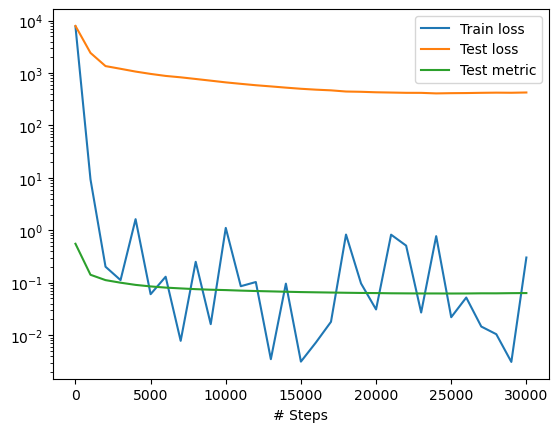

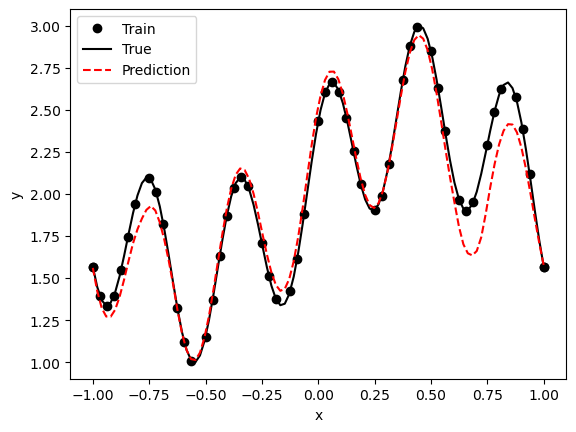

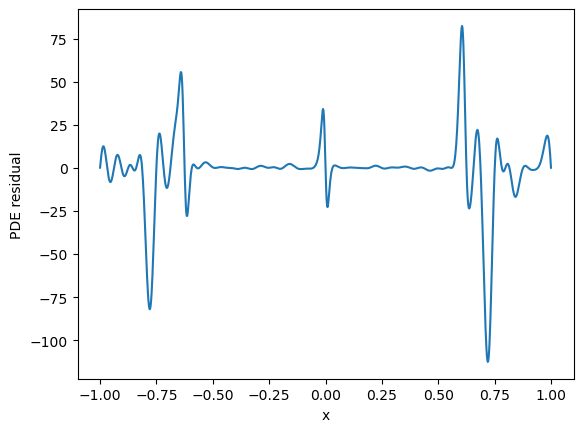

In [15]:
M =200
layer_size = [1] + [M] + [20] + [1]
activation = ["sin", 'sigmoid','linear']

initializer = "Glorot uniform"

net = dde.nn.random_FNN(layer_size, activation, initializer, Rm=10)

model = dde.Model(data, net)
model.compile("adam", lr=0.001, metrics=["l2 relative error"])

losshistory, train_state = model.train(iterations=30000)

dde.saveplot(losshistory, train_state, issave=True, isplot=True)

x = geom.uniform_points(1000, True)
y = model.predict(x, operator=pde)
plt.figure()
plt.plot(x, y)
plt.xlabel("x")
plt.ylabel("PDE residual")
plt.show()

## 1D Partition of Unit

In [43]:
pi = np.pi
def pde(x, y):
    dy_xx = dde.grad.hessian(y, x)
    # Use tf.sin for backend tensorflow.compat.v1 or tensorflow
    #return -dy_xx - np.pi ** 2 * tf.sin(np.pi * x)
    return -dy_xx - 13*pi**2*tf.sin(3*pi*x + 3*pi/20)*tf.cos(2*pi*x + pi/10) - 12*pi**2*tf.cos(3*pi*x + 3*pi/20)*tf.sin(2*pi*x + pi/10)

def boundary(x, on_boundary):
    return on_boundary

def func(x):
    #return np.sin(np.pi * x)
    return np.sin(3*pi*x + 3*pi/20)*np.cos(2*pi*x + pi/10) + 2



geom, bc, data = np.empty(4, dtype=object), np.empty(4, dtype=object), np.empty(4, dtype=object)

for i in range(4):
    geom[i] = dde.geometry.Interval(-1 + 0.5*i, -0.5 + 0.5*i)
    bc[i] = dde.icbc.DirichletBC(geom[i], func, boundary)
    num_points = 15
    num_validation = 30
    data[i] = dde.data.PDE(geom[i], pde, bc[i], num_points, 2, solution=func, num_test=num_validation)

In [46]:
model_1, losshistory_1, train_state_1, geom_1 = pou(5, 1, [-1, 1], func, boundary, pde, num_train=20, M=200, iter=80000)

Compiling model...
'compile' took 0.000571 s



Training model...



c:\Users\Marco\anaconda3\lib\site-packages\keras\initializers\initializers_v2.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


0         [1.15e+04, 6.02e+00]    [1.09e+04, 6.02e+00]    [1.49e+00]    
1000      [9.05e+02, 3.16e+01]    [7.49e+02, 3.16e+01]    [1.98e+00]    
2000      [3.61e+02, 9.57e+01]    [3.12e+02, 9.57e+01]    [3.41e+00]    
3000      [1.53e+02, 7.01e+01]    [1.39e+02, 7.01e+01]    [2.91e+00]    
4000      [7.20e+01, 2.02e+01]    [6.71e+01, 2.02e+01]    [1.55e+00]    
5000      [4.02e+01, 1.35e+00]    [3.61e+01, 1.35e+00]    [4.06e-01]    
6000      [3.15e+01, 4.18e-01]    [2.60e+01, 4.18e-01]    [2.52e-01]    
7000      [2.96e+01, 1.19e+00]    [2.36e+01, 1.19e+00]    [3.99e-01]    
8000      [2.89e+01, 1.24e+00]    [2.31e+01, 1.24e+00]    [4.06e-01]    
9000      [2.84e+01, 1.16e+00]    [2.28e+01, 1.16e+00]    [3.92e-01]    
10000     [2.78e+01, 1.08e+00]    [2.23e+01, 1.08e+00]    [3.79e-01]    
11000     [2.73e+01, 1.01e+00]    [2.22e+01, 1.01e+00]    [3.67e-01]    
12000     [2.67e+01, 9.43e-01]    [2.16e+01, 9.43e-01]    [3.54e-01]    
13000     [2.62e+01, 8.83e-01]    [2.13e+01, 8.83e-

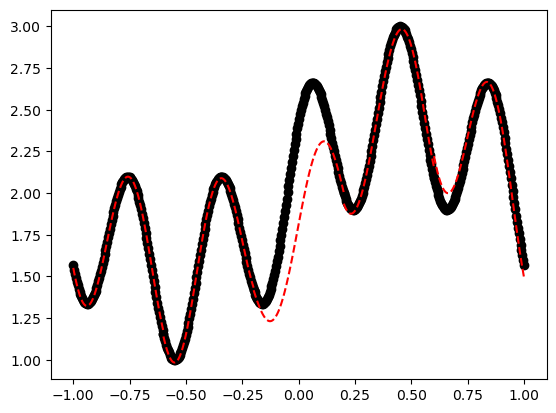

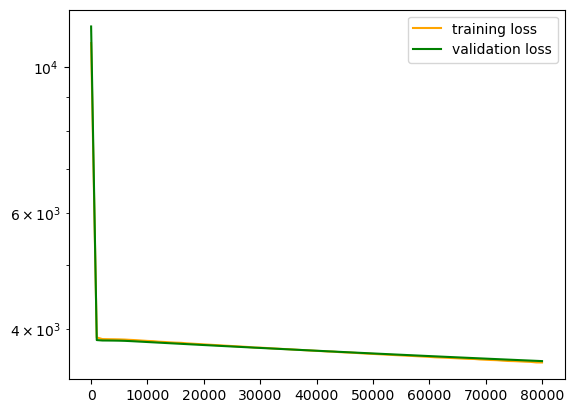

In [47]:
pou_visualization(losshistory_1, train_state_1)

Compiling model...
'compile' took 0.000595 s

Training model...



c:\Users\Marco\anaconda3\lib\site-packages\keras\initializers\initializers_v2.py:120: UserWarning: The initializer GlorotUniform is unseeded and being called multiple times, which will return identical values  each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initalizer instance more than once.
  warnings.warn(


Step      Train loss              Test loss               Test metric   
0         [8.46e+03, 4.09e+00]    [8.83e+03, 4.09e+00]    [1.79e+00]    
1000      [1.19e+03, 1.73e+01]    [9.19e+02, 1.73e+01]    [1.61e+00]    
2000      [9.14e+02, 7.75e+00]    [7.08e+02, 7.75e+00]    [1.56e+00]    
3000      [6.12e+02, 1.25e+01]    [4.82e+02, 1.25e+01]    [2.04e+00]    
4000      [3.66e+02, 4.46e+01]    [2.95e+02, 4.46e+01]    [3.10e+00]    
5000      [2.16e+02, 9.28e+01]    [1.79e+02, 9.28e+01]    [4.11e+00]    
6000      [1.50e+02, 1.28e+02]    [1.26e+02, 1.28e+02]    [4.70e+00]    
7000      [1.29e+02, 1.37e+02]    [1.09e+02, 1.37e+02]    [4.82e+00]    
8000      [1.22e+02, 1.33e+02]    [1.04e+02, 1.33e+02]    [4.74e+00]    
9000      [1.17e+02, 1.26e+02]    [1.00e+02, 1.26e+02]    [4.62e+00]    
10000     [1.13e+02, 1.20e+02]    [9.68e+01, 1.20e+02]    [4.50e+00]    
11000     [1.08e+02, 1.13e+02]    [9.31e+01, 1.13e+02]    [4.37e+00]    
12000     [1.04e+02, 1.06e+02]    [9.00e+01, 1.06e+

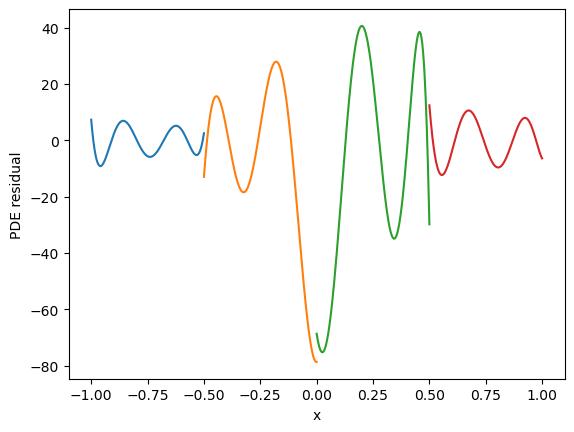

In [31]:
M =200
layer_size = [1] + [M] + [1]
activation = ["sin", 'linear']

initializer = "Glorot uniform"

net = dde.nn.random_FNN(layer_size, activation, initializer, Rm=10)

model, x, y = np.empty(4, dtype=object), np.empty(4, dtype=object), np.empty(4, dtype=object)
losshistory, train_state = np.empty(4, dtype=object), np.empty(4, dtype=object)
for i in range(4):

    model[i] = dde.Model(data[i], net)
    model[i].compile("adam", lr=0.001, metrics=["l2 relative error"])

    losshistory[i], train_state[i] = model[i].train(iterations=100000)

    #dde.saveplot(losshistory, train_state, issave=True, isplot=True)

    x[i] = geom[i].uniform_points(300, True)
    y[i] = model[i].predict(x[i], operator=pde)
#plt.figure()
    plt.plot(x[i], y[i])
plt.xlabel("x")
plt.ylabel("PDE residual")
plt.show()

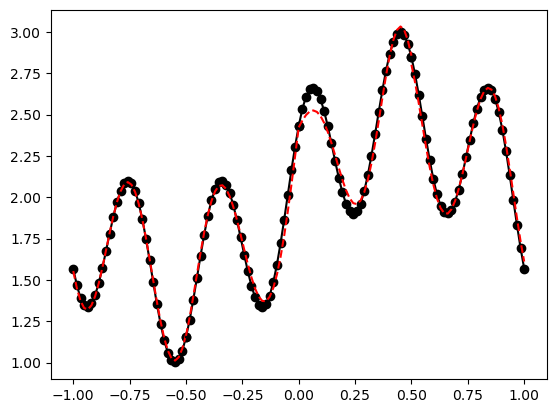

In [50]:
xtest, ytest, ypred = np.empty(4, dtype=object), np.empty(4, dtype=object), np.empty(4, dtype=object)
for i in range(4):
    xtest[i], ytest[i], ypred[i] = train_state[i].X_test, train_state[i].y_test, train_state[i].y_pred_test

    u = xtest[i][1]
    xtest[i] = np.delete(xtest[i], 1)
    xtest[i] = np.append(xtest[i], u)

    uu = ytest[i][1]
    ytest[i] = np.delete(ytest[i], 1)
    ytest[i] = np.append(ytest[i], uu)

    uuu = ypred[i][1]
    ypred[i] = np.delete(ypred[i], 1)
    ypred[i] = np.append(ypred[i], uuu)

    plt.scatter(xtest[i], ytest[i], c='black')
    plt.plot(xtest[i], ytest[i], c='black')
    plt.plot(xtest[i], ypred[i], c='red', ls = '--')

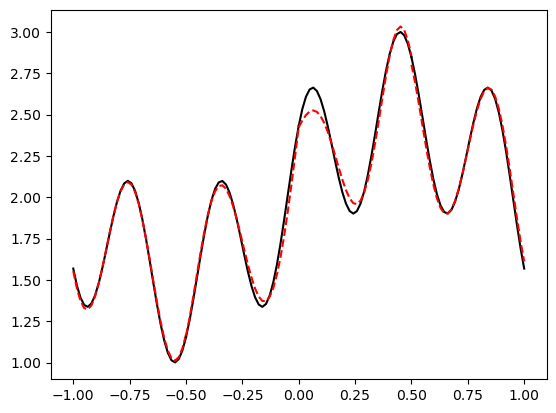

In [51]:
for i in range(4):    
    #plt.scatter(xtest[i], ytest[i], c='black')
    plt.plot(xtest[i], ytest[i], c='black')
    plt.plot(xtest[i], ypred[i], c='red', ls = '--')

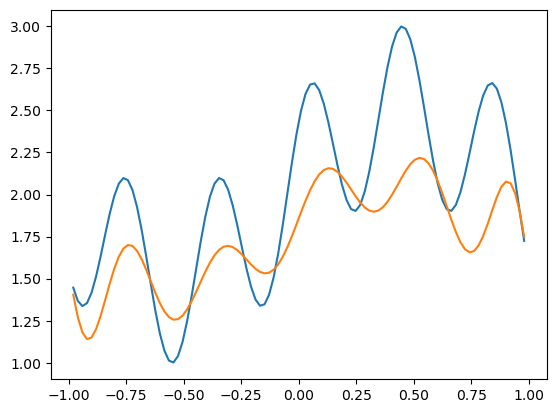

In [29]:
plt.plot(train_state.X_test[2:], train_state.y_test[2:])
plt.plot(train_state.X_test[2:], train_state.y_pred_test[2:])

In [1]:
import sys
sys.path.append('../../code')
import deepxde as dde
import matplotlib.pyplot as plt
import numpy as np
# Import tf if using backend tensorflow.compat.v1 or tensorflow
from deepxde.backend import tf
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Activation

Using backend: tensorflow
Other supported backends: tensorflow.compat.v1, pytorch, jax, paddle.
paddle supports more examples now and is recommended.


In [8]:
dim = 1
M = 20
Rm = 10

train = np.array([np.linspace(-2, 2, 40)])
test = np.array([np.linspace(-2, 2, 100)])

def func(x):
    return np.sin(np.pi * x)
    #return np.sin(3*pi*x + 3*pi/20)*np.cos(2*pi*x + pi/10) + 2
    
y_train = func(train).T

y_test = func(test).T

k_init = tf.keras.initializers.RandomUniform(minval=-Rm, maxval=Rm)
b_init = tf.keras.initializers.RandomUniform(minval=-Rm/10, maxval=Rm/10)
def custom_activation(x):
    return tf.sin(x)

model = Sequential()
#layer1 = Dense(M, activation=custom_activation)

model.add(Dense(M, activation=custom_activation, input_dim=dim, kernel_initializer=k_init,bias_initializer=b_init, trainable=False))
model.add(Dense(1))


'''model = Sequential()
model.add(dde.nn.MyLayer(M, custom_activation))
model.add(Dense(1))
'''
model.compile(loss=tf.keras.losses.MeanSquaredError(), optimizer='adam', 
                metrics=[tf.keras.losses.MeanAbsoluteError(reduction="auto", name="mean_absolute_error"),'accuracy'])

callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=100)
history = model.fit(train.T, y_train, validation_data = (test.T,y_test), epochs=2000, batch_size=64, callbacks=[callback])

Epoch 1/2000
1/1 [==============================] - 1s 726ms/step - loss: 1.3982 - mean_absolute_error: 1.0084 - accuracy: 0.0000e+00 - val_loss: 1.3959 - val_mean_absolute_error: 0.9324 - val_accuracy: 0.0000e+00
Epoch 2/2000
1/1 [==============================] - 0s 42ms/step - loss: 1.3900 - mean_absolute_error: 1.0053 - accuracy: 0.0000e+00 - val_loss: 1.3877 - val_mean_absolute_error: 0.9295 - val_accuracy: 0.0000e+00
Epoch 3/2000
1/1 [==============================] - 0s 43ms/step - loss: 1.3818 - mean_absolute_error: 1.0022 - accuracy: 0.0000e+00 - val_loss: 1.3796 - val_mean_absolute_error: 0.9267 - val_accuracy: 0.0000e+00
Epoch 4/2000
1/1 [==============================] - 0s 48ms/step - loss: 1.3737 - mean_absolute_error: 0.9991 - accuracy: 0.0000e+00 - val_loss: 1.3716 - val_mean_absolute_error: 0.9238 - val_accuracy: 0.0000e+00
Epoch 5/2000
1/1 [==============================] - 0s 42ms/step - loss: 1.3656 - mean_absolute_error: 0.9960 - accuracy: 0.0000e+00 - val_loss: 1.

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 20)                40        
                                                                 
 dense_3 (Dense)             (None, 1)                 21        
                                                                 
Total params: 61
Trainable params: 21
Non-trainable params: 40
_________________________________________________________________
None


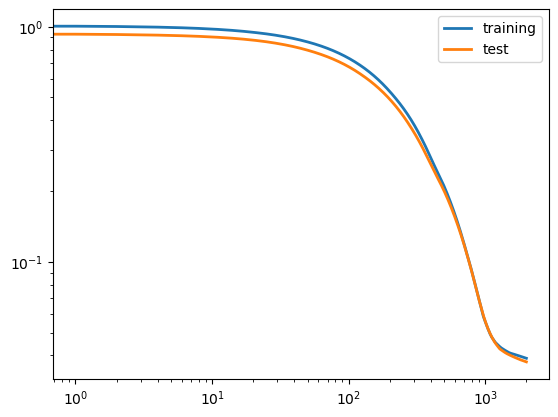

In [9]:
print(model.summary())
bc     = history.history['mean_absolute_error']
bc_val     = history.history['val_mean_absolute_error']

plt.loglog(range(np.shape(bc)[0]),bc, linewidth=2, label='training')
plt.loglog(range(np.shape(bc_val)[0]),bc_val, linewidth=2, label='test')
plt.legend()
plt.show()

32/32 [==============================] - 0s 2ms/step


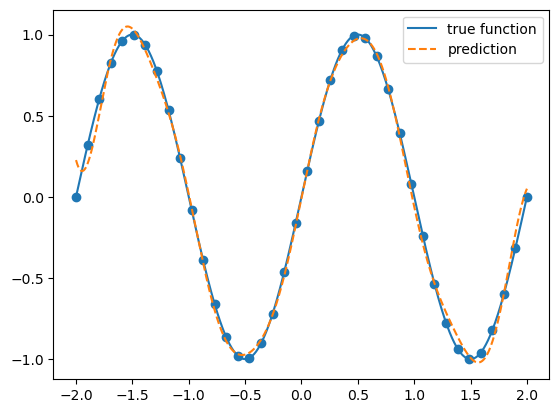

In [10]:
val = np.linspace(-2, 2, 1000)

y_pred = model.predict(val)
plt.plot(val, func(val), label='true function')
plt.plot(val, y_pred, label='prediction', ls='--')
plt.scatter(train, y_train)
plt.legend()